Install required packages

In [1]:
! pip install numpy


[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [2]:
! pip install pandas



[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [3]:
! pip install networkx


[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [4]:
! pip install matplotlib


[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [5]:
! pip install matplotlib-inline


[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [6]:
! pip install community


[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [7]:
! pip install python-louvain


[notice] A new release of pip available: 22.3 -> 22.3.1
[notice] To update, run: python.exe -m pip install --upgrade pip


In [8]:
import pandas as pd

Just need only 2 columns: "Genre" and "Publisher"

In [9]:
df = pd.read_csv('vgsales.csv', usecols = ['Genre', 'Publisher'])
df_new = df.drop_duplicates().iloc[:-1500]
df_new

,Genre,Publisher
0,Sports,Nintendo
1,Platform,Nintendo
2,Racing,Nintendo
4,Role-Playing,Nintendo
5,Puzzle,Nintendo
...,...,...
2585,Strategy,Banpresto
2596,Action,20th Century Fox Video Games
2598,Adventure,Avanquest Software
2604,Simulation,Hudson Entertainment


Draw the bipartite graph and the non bipartite graph

In [10]:
import networkx as nx
from networkx.algorithms import bipartite
g_1 = nx.Graph()
publishers = df_new['Publisher']
genres = df_new['Genre']
print("Number of publishers: ", publishers.nunique())
print("Number of genres: ", genres.nunique())
print("Number of edges: ", len(df_new))

Number of publishers:  123
Number of genres:  12
Number of edges:  337


In [11]:
for index, row in df_new.iterrows():
    g_1.add_edge(row['Genre'], row['Publisher'], weight = 1)
    g_1.add_nodes_from(genres, bipartite = 0)
    g_1.add_nodes_from(publishers, bipartite = 1)

<Figure size 1500x1500 with 0 Axes>

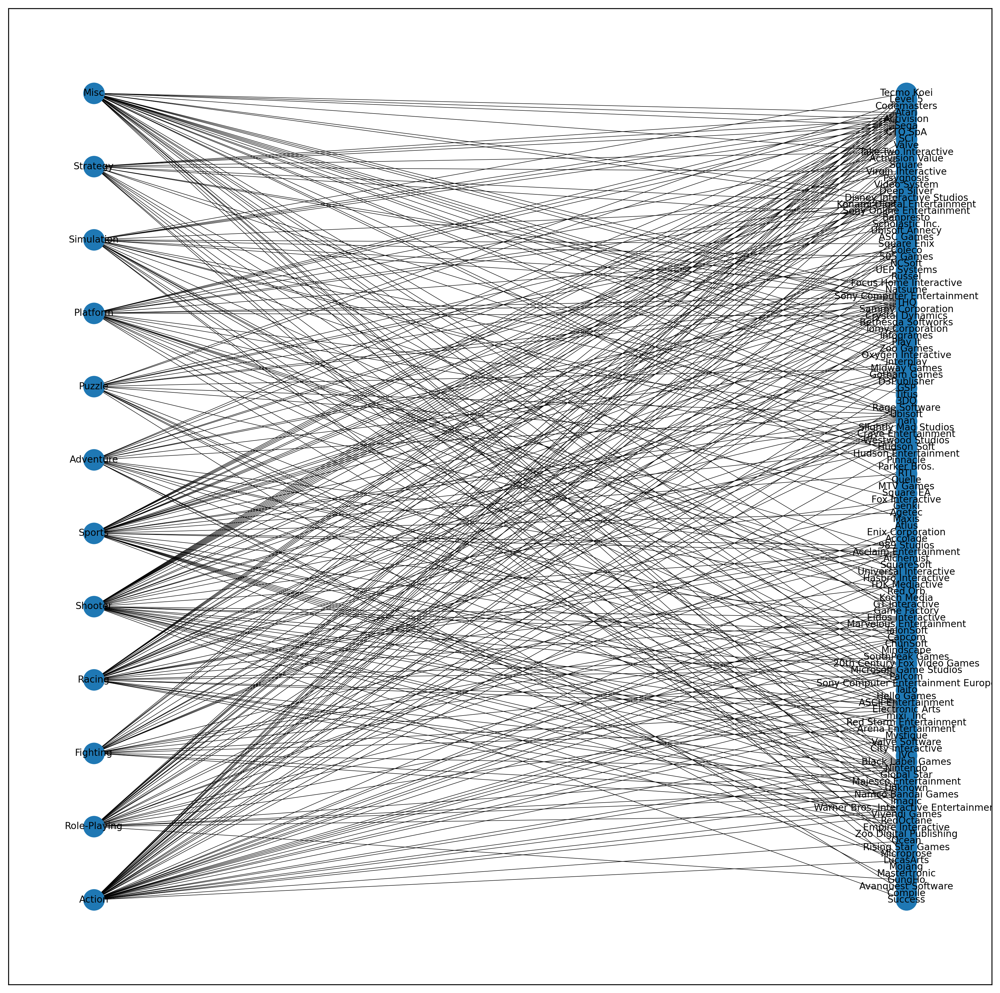

In [12]:
import matplotlib.pyplot as plt
plt.figure(figsize = (15, 15))
pos = nx.spring_layout(g_1)
fig, ax = plt.subplots(1, 1, figsize = (15, 15), dpi = 300)
nx.draw_networkx(g_1, pos = nx.drawing.layout.bipartite_layout(g_1, genres), font_size = 8, width = 0.4)

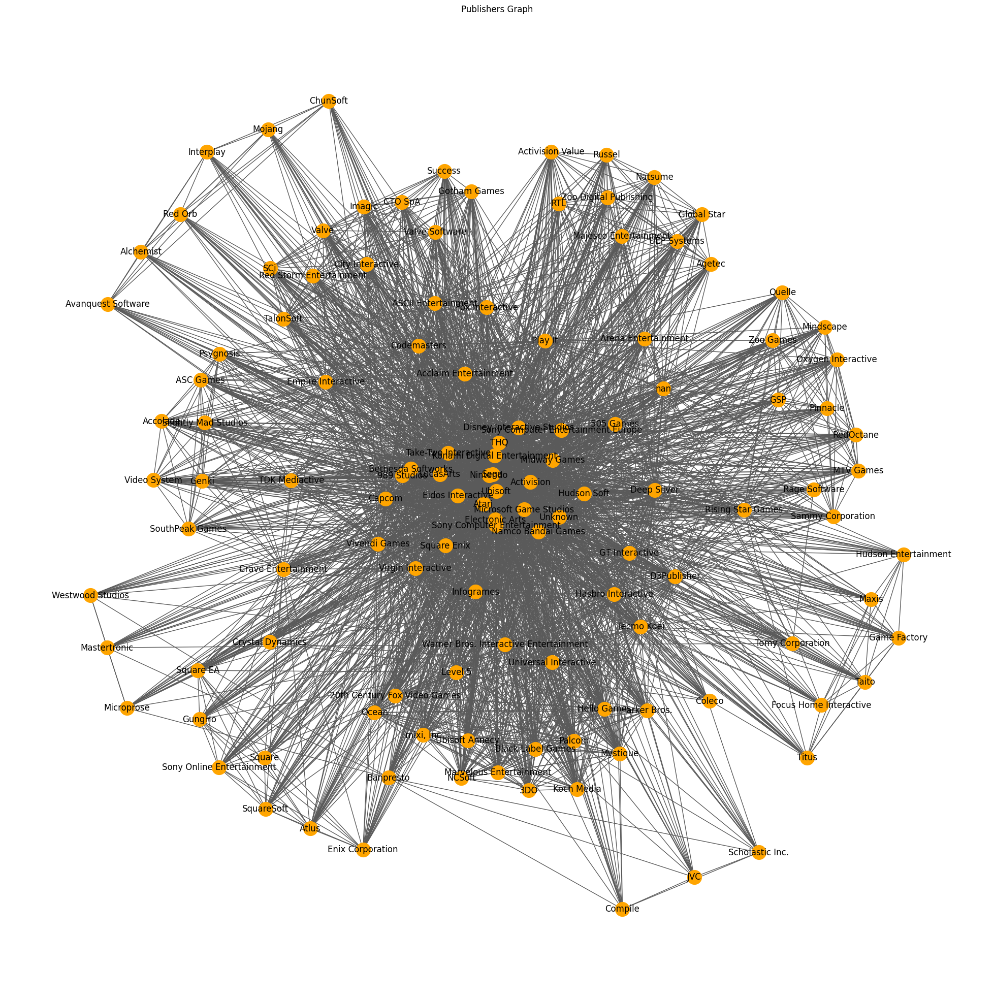

In [13]:
# Remove duplicated publishers from rows of the publishers dataframe 
# (because we need unique publishers to put into the graph):
final_publishers = publishers.drop_duplicates()
g_2 = bipartite.weighted_projected_graph(g_1, final_publishers)
plt.figure(figsize = (25, 25))

layout = nx.spring_layout(g_2)

nx.draw_networkx_nodes(
    g_2,
    layout,
    nodelist = final_publishers,
    node_size = 400,
    node_color = 'orange'
)
nx.draw_networkx_edges(g_2, layout, edge_color = '#5A5A5A')
node_labels = dict(zip(final_publishers, final_publishers))
nx.draw_networkx_labels(g_2, layout, labels = node_labels)
plt.axis('off')
plt.title('Publishers Graph')

plt.show()


Export the non bipartite graph data to a .csv file (to use in Gephi)

In [14]:
labels = nx.get_edge_attributes(g_2, 'weight')
df2 = pd.DataFrame(columns = ['source', 'target', 'weight'])
for key, value in labels.items():
    df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
# Export to .csv file to be used in Gephi
df2.to_csv('vgsales_gephi.csv', index = False, header = True)
# If this file is compiled with Google Colab please add '/' before the file name to get the 
# exported csv in the root directory as below:
# df2.to_csv('/vgsales_gephi.csv', index = False, header = True)

C:\Users\Tri Minh Nguyen\AppData\Local\Temp\ipykernel_7856\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\Tri Minh Nguyen\AppData\Local\Temp\ipykernel_7856\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\Tri Minh Nguyen\AppData\Local\Temp\ipykernel_7856\566239561.py:4: FutureWarning: The frame.append method is deprecated and will be removed from pandas in a future version. Use pandas.concat instead.
  df2 = df2.append({'source': key[0], 'target': key[1], 'weight': value}, ignore_index = True)
C:\Users\Tri Minh Nguyen\AppData\Local\Temp\ipykernel_7856\566239561.py:4: FutureWarning: T

A. Communities detection algorithms

1. Louvain algorithm

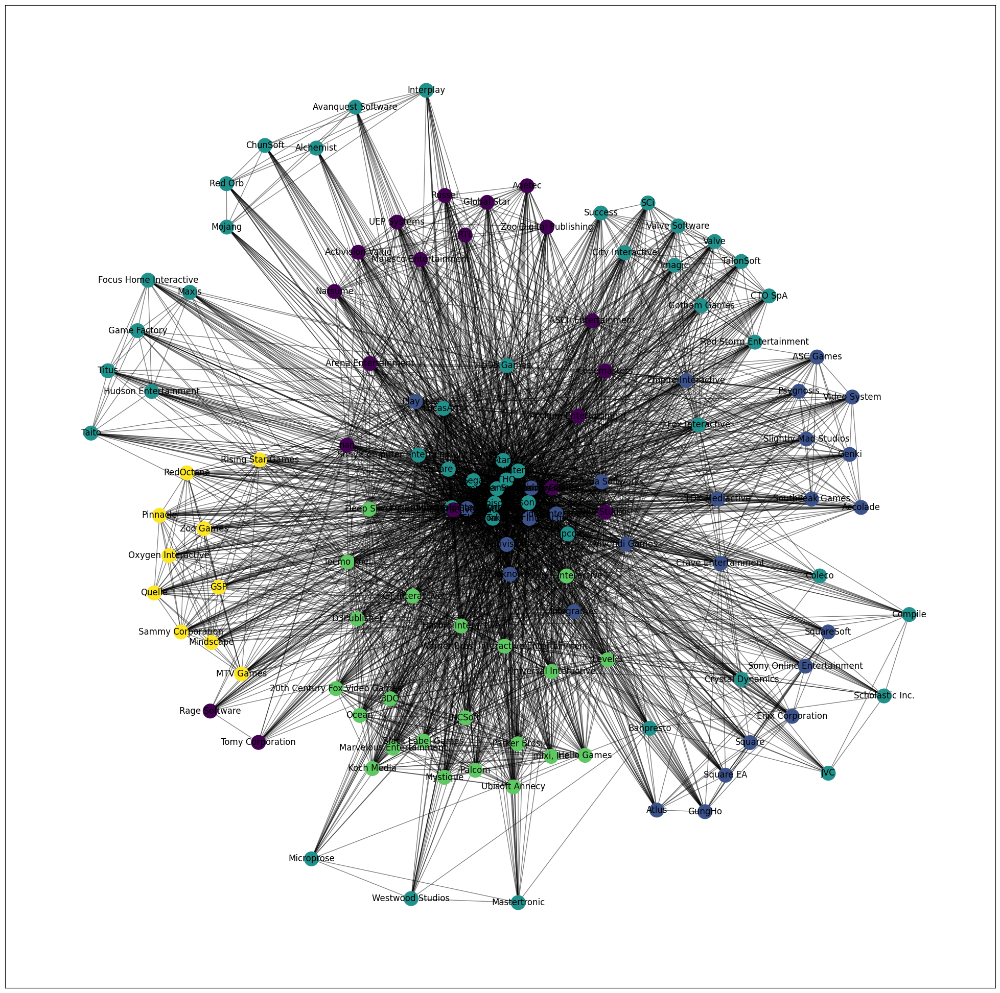

In [48]:
import matplotlib.cm as cm
import matplotlib
from community import community_louvain

plt.figure(figsize = (25, 25))

# Compute the best partition
partition = community_louvain.best_partition(g_2)

# Draw the graph
pos = nx.spring_layout(g_2)
# Color the nodes according to their partitions
cmap = cm.get_cmap('viridis', max(partition.values()) + 1)
nx.draw_networkx_nodes(g_2, pos, partition.keys(), node_size = 400, cmap = cmap, node_color = 
list(partition.values()))
nx.draw_networkx_edges(g_2, pos, alpha = 0.5)
nx.draw_networkx_labels(g_2, pos)

plt.show()

Calculate number of communities and show the members of each community

In [49]:
import numpy as np
values = list(partition.values())

# Print number of communities
print('Number of communities: ', len(np.unique(values)))

Number of communities:  5


In [50]:
for i in range(len(np.unique(values))):
    print("---------", "Community ", i + 1, "---------")
    print("")
    for name, k in partition.items():
        if k == i:
            print(name)
    print("")

--------- Community  1 ---------

Acclaim Entertainment
Disney Interactive Studios
nan
Majesco Entertainment
Codemasters
Arena Entertainment
Midway Games
989 Studios
UEP Systems
ASCII Entertainment
Activision Value
Global Star
RTL
Natsume
Zoo Digital Publishing
Russel
Agetec
Tomy Corporation
Rage Software

--------- Community  2 ---------

Microsoft Game Studios
Take-Two Interactive
Activision
Bethesda Softworks
SquareSoft
Eidos Interactive
Vivendi Games
Enix Corporation
Namco Bandai Games
Infogrames
Unknown
Square
Video System
GungHo
Crave Entertainment
Atlus
TDK Mediactive
ASC Games
Accolade
Sony Online Entertainment
SouthPeak Games
Psygnosis
Empire Interactive
Play It
Slightly Mad Studios
Genki
Square EA

--------- Community  3 ---------

Nintendo
Sony Computer Entertainment
Ubisoft
Electronic Arts
Sega
Atari
505 Games
Capcom
Konami Digital Entertainment
Sony Computer Entertainment Europe
Square Enix
LucasArts
THQ
Fox Interactive
Red Orb
JVC
Maxis
Imagic
Valve Software
Valve
Banpres

Analyse genres of each community to get to know its meaning

Analyse genres of each community

--------- Community  1 ---------

Sports: 16
Platform: 2
Racing: 6
Role-Playing: 0
Puzzle: 2
Misc: 2
Shooter: 3
Simulation: 0
Action: 3
Fighting: 5
Adventure: 1
Strategy: 0



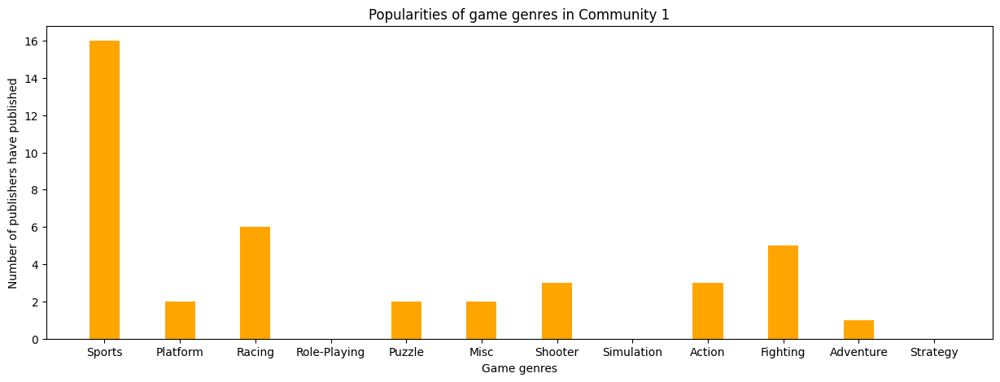


--------- Community  2 ---------

Sports: 7
Platform: 4
Racing: 20
Role-Playing: 17
Puzzle: 1
Misc: 8
Shooter: 8
Simulation: 3
Action: 8
Fighting: 3
Adventure: 1
Strategy: 4



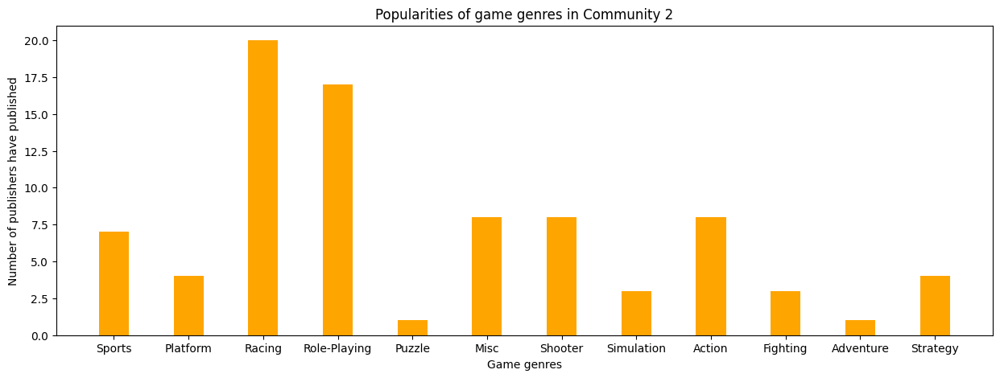


--------- Community  3 ---------

Sports: 10
Platform: 14
Racing: 7
Role-Playing: 9
Puzzle: 12
Misc: 9
Shooter: 25
Simulation: 18
Action: 13
Fighting: 9
Adventure: 18
Strategy: 12



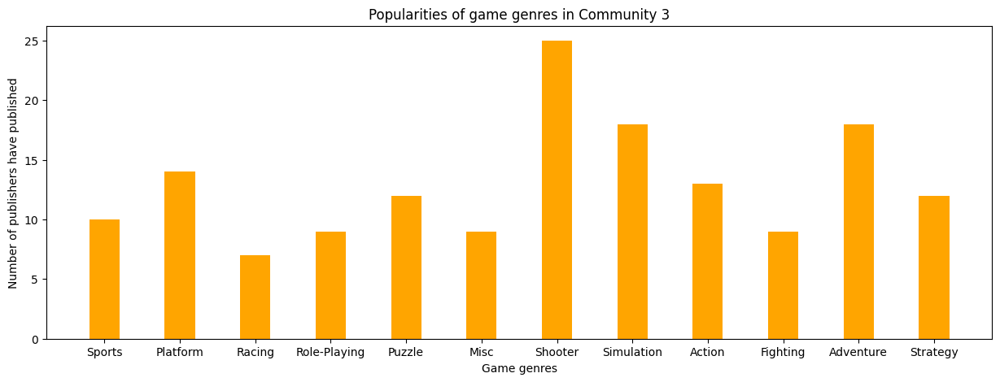


--------- Community  4 ---------

Sports: 1
Platform: 4
Racing: 0
Role-Playing: 2
Puzzle: 3
Misc: 3
Shooter: 1
Simulation: 1
Action: 22
Fighting: 4
Adventure: 0
Strategy: 2



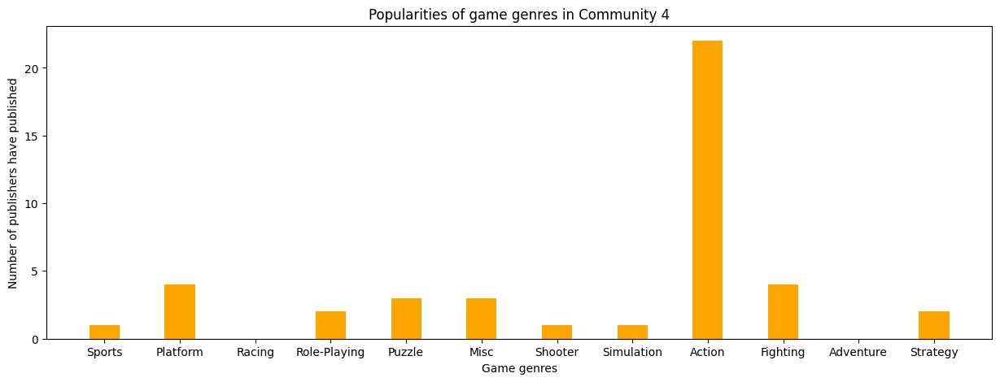


--------- Community  5 ---------

Sports: 0
Platform: 0
Racing: 0
Role-Playing: 0
Puzzle: 0
Misc: 10
Shooter: 0
Simulation: 1
Action: 0
Fighting: 0
Adventure: 0
Strategy: 0



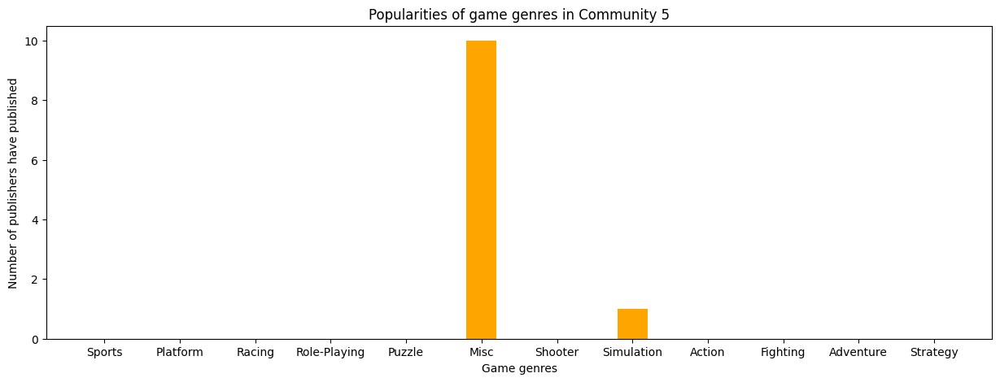

In [59]:
# Remove duplicated genres from rows of the genres dataframe 
# (because we need unique genres):
final_genres = genres.drop_duplicates()
comNodes = []
print("Analyse genres of each community")
print("")

for c in range(len(np.unique(values))):
    comNodes.clear()
    genresValues = []
    print("---------", "Community ", c + 1, "---------")
    print("")
    for name, k in partition.items():
        if k == c:
            comNodes.append(name)
    for genre in final_genres:
        hasGenreCount = 0
        for i in comNodes:
            # Search in the dataframe if this publisher in this community
            # has a connection to this genre or not
            if ((df_new['Genre'] == genre) & (df_new['Publisher'] == i)).any():
                hasGenreCount = hasGenreCount + 1
        genresValues.append(hasGenreCount)
        print(genre + ": " + str(hasGenreCount))

    # Draw bar chart    
    print("")
    fig = plt.figure(figsize = (15, 5))
    # Creating the bar plot
    plt.bar(final_genres, genresValues, color ='orange', width = 0.4)
    plt.xlabel("Game genres")
    plt.ylabel("Number of publishers have published")
    plt.title("Popularities of game genres in Community " + str(c + 1))
    plt.show()
    print("")